1. Train at least two advanced models on the energy dataset from TSA_Example notebook. You may choose to use only the last 5 years of the dataset to reduce data size

2. Explain the patterns the model has learned using SHAP local and global plots

3. Explain the patterns using LIME

4. Compare the answers from LIME & SHAP (global & some local) – what do you see? Is it the same?

In [149]:
#Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import xgboost as xgb
import setuptools.dist
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import lime
import lime.lime_tabular
from sklearn.metrics import mean_absolute_error

In [150]:
#Load Data
df = pd.read_csv("/content/PJME_hourly.csv")
df = df.set_index('Datetime')
df.index = pd.to_datetime(df.index)
df = df.sort_index()

In [151]:
last_date = df.index[-1]
start_date = last_date - pd.DateOffset(years=5)
df = df[df.index >= start_date]

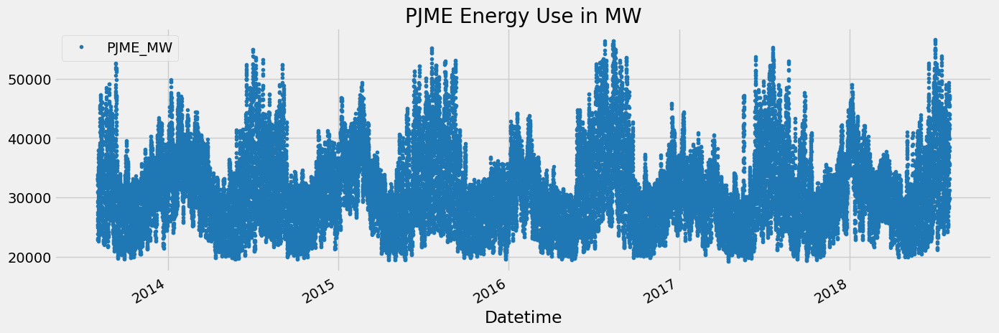

In [152]:
df.plot(style='.',
        figsize=(15, 5),
        color=color_pal[0],
        title='PJME Energy Use in MW')
plt.show()

In [153]:
def create_features(df):
    """
    Create time series features and lag features based on time series index.
    """
    df = df.copy()

    # Basic time-based features
    df['hour'] = df.index.hour
    df['dayofweek'] = df.index.dayofweek
    df['quarter'] = df.index.quarter
    df['month'] = df.index.month
    df['year'] = df.index.year
    df['dayofyear'] = df.index.dayofyear
    df['dayofmonth'] = df.index.day
    df['weekofyear'] = df.index.isocalendar().week

    # Lag features
    df['lag_1d'] = df['PJME_MW'].shift(1)   # 1 day lag
    df['lag_1w'] = df['PJME_MW'].shift(7)   # 1 week lag
    df['lag_1m'] = df['PJME_MW'].shift(30)  # 1 month lag (approx. 30 days)
    df['lag_1y'] = df['PJME_MW'].shift(365) # 1 year lag

    # Rolling statistics features
    df['rolling_mean_3d'] = df['PJME_MW'].rolling(window=3).mean()  # Last 3 days rolling mean
    df['rolling_mean_30d'] = df['PJME_MW'].rolling(window=30).mean()  # Last month rolling mean
    df['rolling_mean_same_month_last_year'] = df['PJME_MW'].shift(365).rolling(window=30).mean()  # Same month previous year rolling mean
    df['rolling_mean_same_week_last_year'] = df['PJME_MW'].shift(365).rolling(window=7).mean()  # Same week previous year rolling mean

    return df

df = create_features(df)

/usr/local/lib/python3.11/dist-packages/matplotlib/axis.py:1822: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  ret = self._converter.convert(x, self.units, self)
/usr/local/lib/python3.11/dist-packages/matplotlib/axis.py:1822: UserWarning: Parsing dates in %d-%m-%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  ret = self._converter.convert(x, self.units, self)


<Figure size 640x480 with 0 Axes>

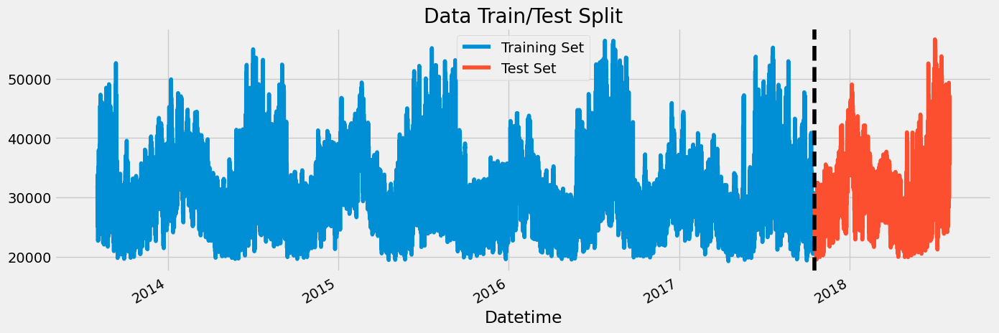

In [154]:
train = df[df.index < "18-10-2017"]
test = df[df.index >= "18-10-2017"]
plt.clf()
fig, ax = plt.subplots(figsize=(15, 5))
train["PJME_MW"].plot(ax=ax, label='Training Set', title='Data Train/Test Split')
test["PJME_MW"].plot(ax=ax, label='Test Set')
ax.axvline('18-10-2017', color='black', ls='--')
ax.legend(['Training Set', 'Test Set'])
plt.show()

In [155]:
train = create_features(train)
test = create_features(test)

In [156]:
FEATURES = [
    'hour', 'dayofweek', 'quarter', 'month', 'year', 'dayofyear', 'dayofmonth', 'weekofyear',

]

TARGET = 'PJME_MW'

X_train = train[FEATURES]
y_train = train[TARGET]

X_test = test[FEATURES]
y_test = test[TARGET]

In [157]:
# Convert UInt32 columns to int32 because TensorFlow does not support UInt32
X_train_scaled = X_train.astype(np.int32)
X_test_scaled = X_test.astype(np.int32)

In [158]:
# Standardize the data for neural network
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [159]:
#Train XGBoost
xgb_model = xgb.XGBRegressor(objective="reg:squarederror", learning_rate=0.1, random_sate=42)
xgb_model.fit(X_train, y_train)

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:52:13] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_sate" } are not used.

  warnings.warn(smsg, UserWarning)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_sate=42, ...)

In [160]:
# Train a simple neural network
model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    layers.Dense(32, activation='relu'),
    layers.Dense(1)  # Regression output layer
])

model.compile(optimizer='adam', loss='mse')
model.fit(X_train_scaled, y_train, epochs=20, batch_size=16, verbose=1, validation_data=(X_test_scaled, y_test))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
2306/2306 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 795779328.0000 - val_loss: 96696680.0000
Epoch 2/20
2306/2306 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - loss: 99159144.0000 - val_loss: 33544794.0000
Epoch 3/20
2306/2306 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 32102312.0000 - val_loss: 26650102.0000
Epoch 4/20
2306/2306 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 28621372.0000 - val_loss: 26336658.0000
Epoch 5/20
2306/2306 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - loss: 28517050.0000 - val_loss: 26525752.0000
Epoch 6/20
2306/2306 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 28291154.0000 - val_loss: 26695650.0000
Epoch 7/20
2306/2306 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - loss: 28501880.0000 - val_loss: 27092102.0000
Epoch 8/20
2306/2306 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 28133000.0000 - val_loss: 27205456.0000
Epoch 9/20
2306/2306 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 28233862.0000 - val_loss: 27253960.0000
Epoch 10/20
2306/2306 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - loss: 28397876.0000

In [161]:
from sklearn.metrics import mean_squared_error

In [162]:
xgb_pred = xgb_model.predict(X_test)
nn_pred = model.predict(X_test_scaled)


print("XGBoost MAE:", mean_squared_error(y_test, xgb_pred))
print("NN MAE:", mean_squared_error(y_test, nn_pred))

217/217 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
XGBoost MAE: 13544188.021079468
NN MAE: 27175330.891610365


 99%|===================| 6875/6937 [00:35<00:00]       

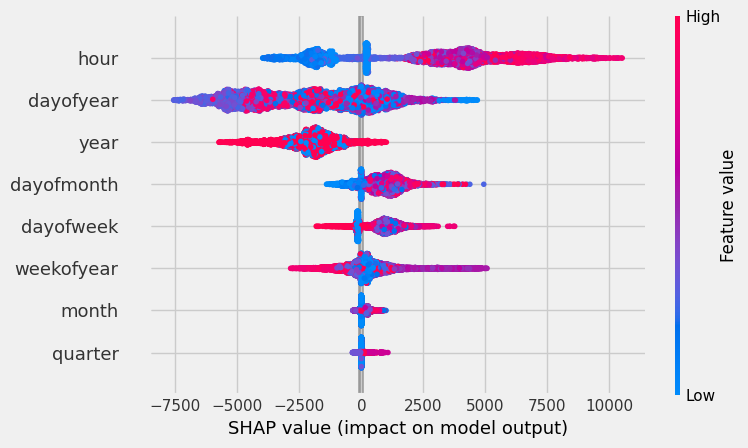

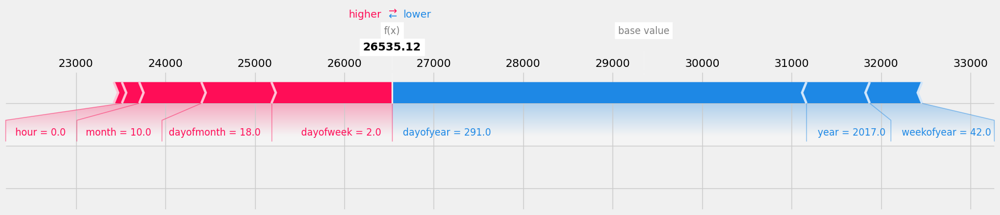

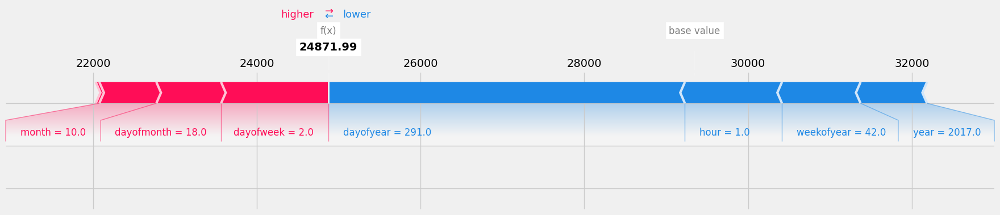

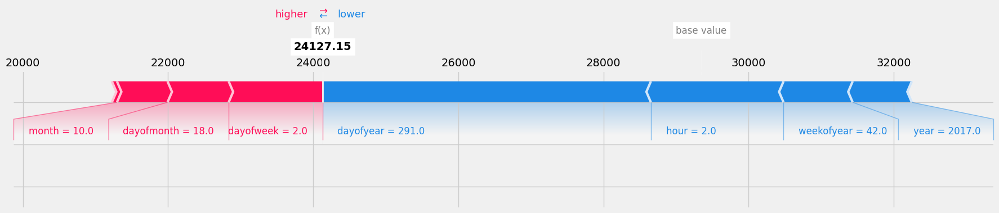

In [163]:
# SHAP explanation for XGBoost
explainer_xgb = shap.Explainer(xgb_model, X_test_scaled)
shap_values_xgb = explainer_xgb(X_test)

# SHAP summary plot (Global explanation)
shap.summary_plot(shap_values_xgb, X_test)

# SHAP force plot for local explanation
shap.initjs()
for i in range(3):
    shap.force_plot(explainer_xgb.expected_value, shap_values_xgb[i].values, X_test.iloc[i,:], matplotlib=True)

ExactExplainer explainer: 6938it [01:27, 76.18it/s]                          


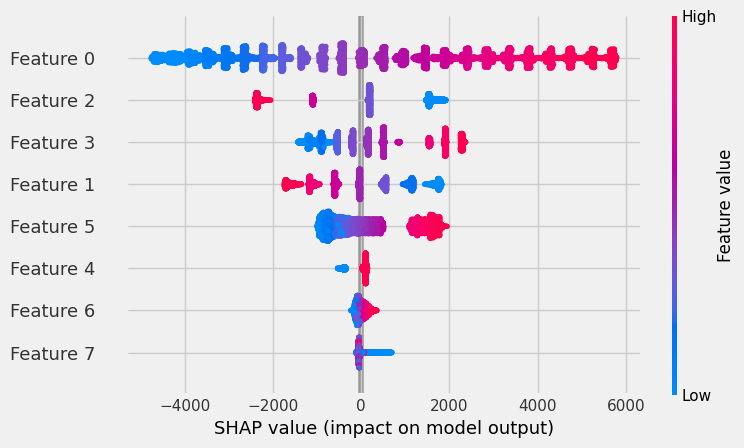

AttributeError: 'ExactExplainer' object has no attribute 'expected_value'

In [166]:
# SHAP explanation for XGBoost
explainer_nn = shap.Explainer(model, X_test_scaled)
shap_values_nn = explainer_nn(X_test_scaled)



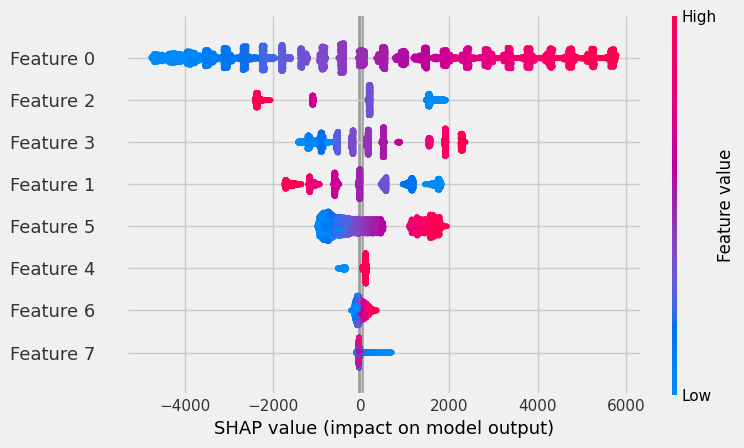

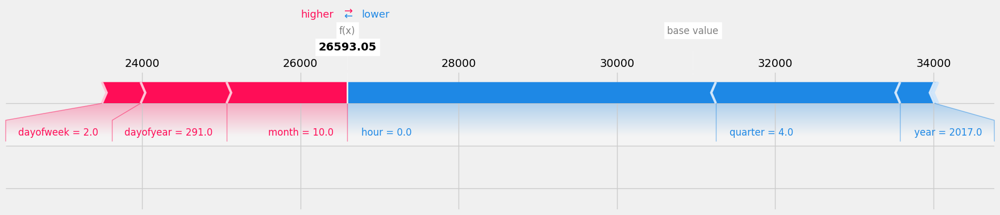

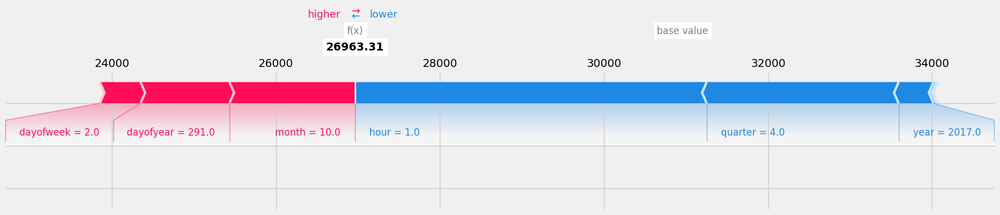

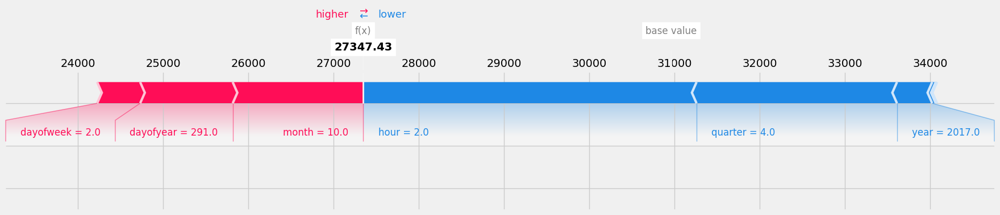

In [172]:
# SHAP summary plot (Global explanation)
shap.summary_plot(shap_values_nn, X_test_scaled)

# SHAP force plot for local explanation
shap.initjs()
for i in range(3):
    shap.force_plot(shap_values_nn[i].base_values,shap_values_nn[i].values, X_test.iloc[i,:], matplotlib=True)


<Figure size 1200x2000 with 0 Axes>

<Figure size 1200x2000 with 0 Axes>

<Figure size 1200x2000 with 0 Axes>

<Figure size 1200x2000 with 0 Axes>

<Figure size 1200x2000 with 0 Axes>

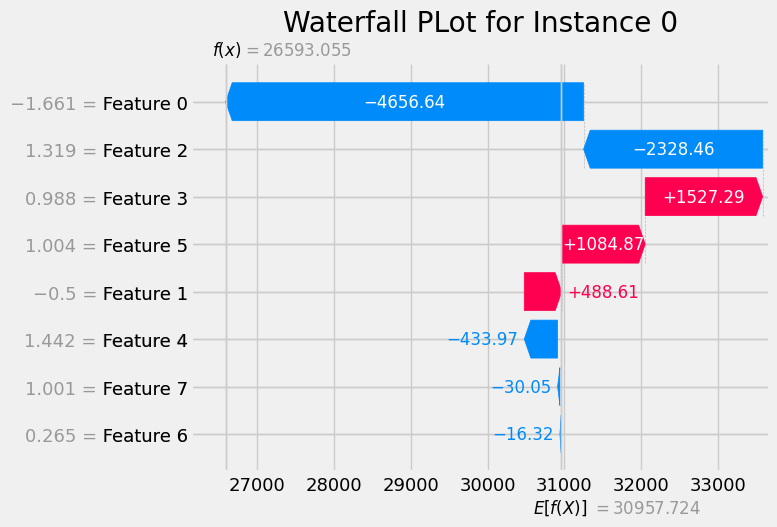

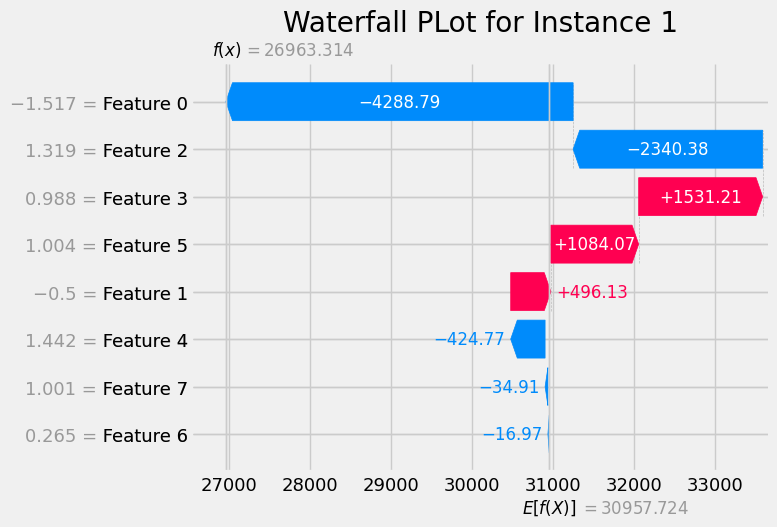

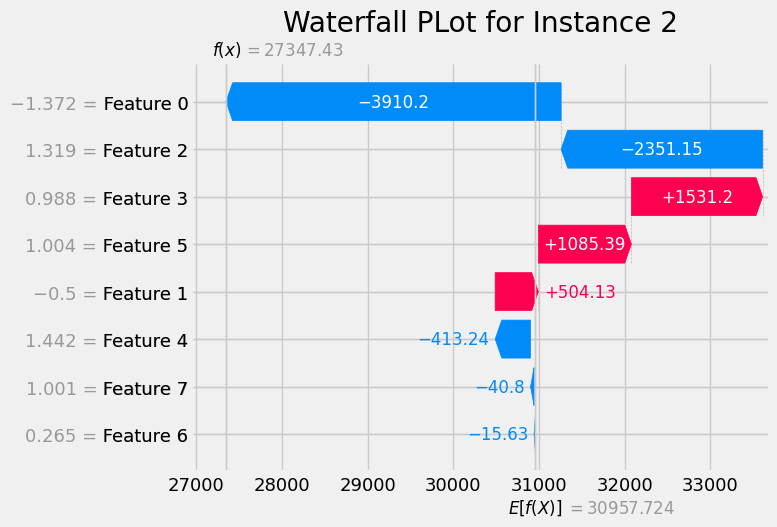

In [183]:
plt.figure(figsize=(12, 20))
for i in range(3):
  shap.plots.waterfall(shap_values_nn[i], show=False)
  plt.title(f"Waterfall PLot for Instance {i}")
  plt.tight_layout()
  plt.show()

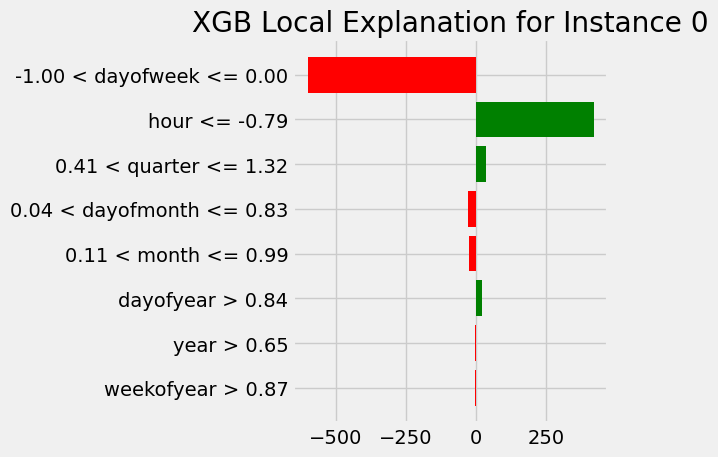

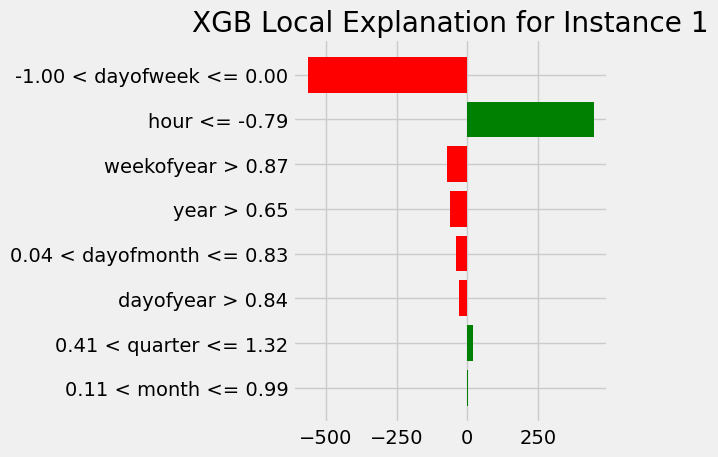

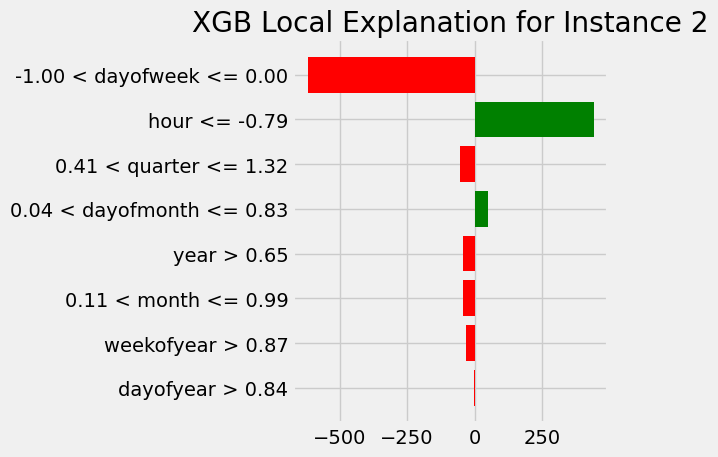

In [190]:
explainer_xgb = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,  # The training data used to fit the model
    training_labels=y_train,      # The labels for the training data
    mode='regression',            # Since you're performing regression
    feature_names=FEATURES,       # Feature names of the dataset
    class_names=[TARGET],         # Name of the target variable
    discretize_continuous=True    # Discretize continuous variables for interpretability
)

# Select a single instance to explain (for example, the first test instance)
instances = [0,1,2]
for i in instances:
  exp_xgb = explainer_xgb.explain_instance(X_test_scaled[i], xgb_model.predict)

  # Show the explanation as a table (local explanation)
  exp_xgb.show_in_notebook(show_table=True, show_all=False)

  # Plot the explanation (global explanation)
  exp_xgb.as_pyplot_figure()
  plt.title(f"XGB Local Explanation for Instance {i}")
  plt.tight_layout()
  plt.show()

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


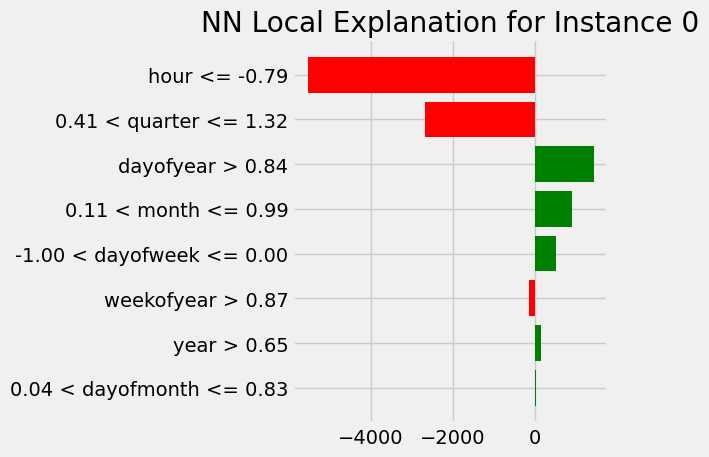

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


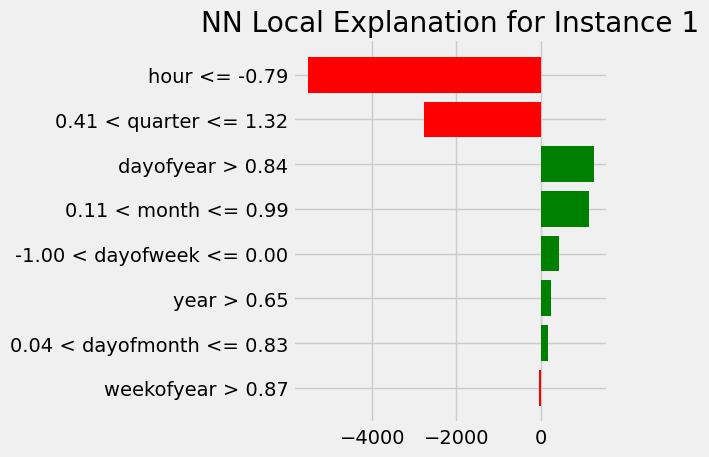

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


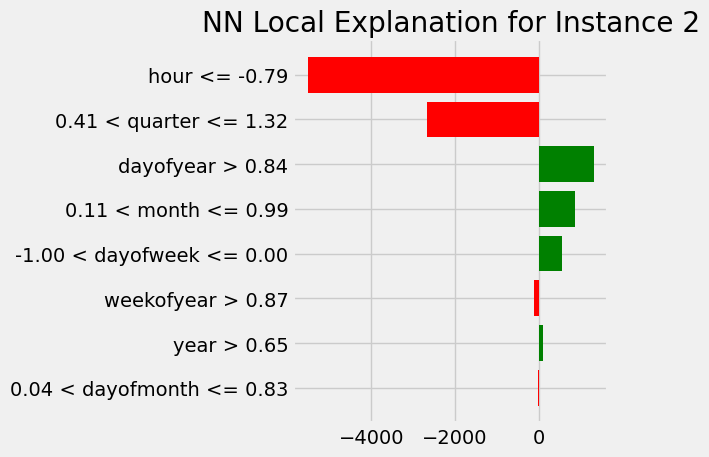

In [194]:
explainer_nn = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,  # The training data used to fit the model
    training_labels=y_train,      # The labels for the training data
    mode='regression',            # Since you're performing regression
    feature_names=FEATURES,       # Feature names of the dataset
    class_names=[TARGET],         # Name of the target variable
    discretize_continuous=True    # Discretize continuous variables for interpretability
)


instances = [0,1,2]
for i in instances:
  exp_nn = explainer_nn.explain_instance(X_test_scaled[i], model.predict)

  # Show the explanation as a table (local explanation)
  exp_nn.show_in_notebook(show_table=True, show_all=False)

  # Plot the explanation (global explanation)
  exp_nn.as_pyplot_figure()
  plt.title(f"NN Local Explanation for Instance {i}")
  plt.tight_layout()
  plt.show()

for xgb the shap global shows us that the most important feature is hour with high values to push the model into the correct prediction.
From the local point though we see that dayofyear,year,and eek of year with lower values tend to affect the model more to make wrong predictions.

IN neural netowrks on the other side the hour feature, while from the global plot seems to affect the model pushing it to make the correct predictions, from its local analysis we see that is happening the opposite.
The xgb is more affected from hour, dayofyear, year while nn is hour, quarter, month.

Lime on the other hand analysis as most important features dayofweak, hour, quaret. for xgb
and hour, quarter dayofyear for nn.
